In [1]:
# Loading the cifar10 dataset
import tensorflow 
from keras.datasets import cifar10
from matplotlib import pyplot
from scipy.misc import toimage

Using TensorFlow backend.


In [2]:
#loading required libraries
import numpy
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.constraints import maxnorm
from keras.optimizers import SGD
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils
from keras import backend as K
K.set_image_dim_ordering('th')

In [3]:
labels=['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

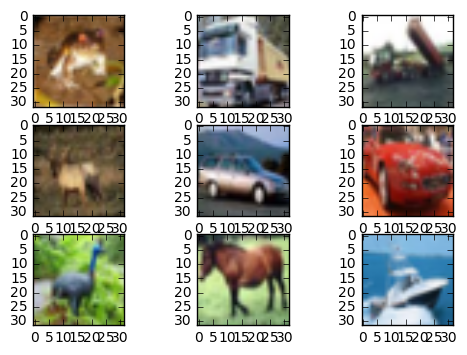

In [4]:
# load data the cifar10 data  into training and test 
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
for i in range(0, 9):
    pyplot.subplot(330 + 1 + i)
    pyplot.imshow(toimage(X_train[i]))
# show the plot
pyplot.show()

In [5]:
# normalize inputs from 0-255 to 0.0-1.0
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0

In [6]:
# one hot encode outputs
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
num_classes = y_test.shape[1]

In [7]:
# Create the model
from keras.callbacks import EarlyStopping
early_stopping_monitor = EarlyStopping(patience=2)
Conv_NN10_1layer = Sequential()
Conv_NN10_1layer.add(Conv2D(64, (3, 3), input_shape=(3, 32, 32), padding='same', activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_1layer.add(Dropout(0.2))
Conv_NN10_1layer.add(Conv2D(64, (3, 3), activation='relu', padding='same', kernel_constraint=maxnorm(3)))
Conv_NN10_1layer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_1layer.add(Flatten())
Conv_NN10_1layer.add(Dense(512, activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_1layer.add(Dropout(0.5))
Conv_NN10_1layer.add(Dense(num_classes, activation='softmax'))
# Compile model
epochs = 20
lrate = 0.005
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
Conv_NN10_1layer.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
print(Conv_NN10_1layer.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 32, 32)        1792      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 32, 32)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 16, 16)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 16384)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               8389120   
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
__________

In [11]:
# Fit the model
#Conv_NN10_1layer.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=32)
Conv_NN10_1layer.fit(X_train, y_train, epochs=5, batch_size=64)

Epoch 1/5
50000/50000 [==============================] - 1914s - loss: 1.1760 - acc: 0.5798     

In [ ]:
# Final evaluation of the model
scores = Conv_NN10_1layer.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

In [15]:
early_stopping_monitor = EarlyStopping(patience=2)

In [19]:
# Fit the model
#Conv_NN10_1layer.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=32)
Conv_NN10_1layer.fit(X_train, y_train, epochs=epochs, batch_size=64,validation_split=0.1,callbacks=[early_stopping_monitor])
# Final evaluation of the model
scores = Conv_NN10_1layer.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 45000 samples, validate on 5000 samples
Epoch 1/20
45000/45000 [==============================] - 981s - loss: 0.5728 - acc: 0.8049 - val_loss: 0.6868 - val_acc: 0.7622

In [20]:
from keras.models import load_model
Conv_NN10_1layer.save('Conv_NN10_1layer.h5')
Conv_NN10_1layer1=load_model('Conv_NN10_1layer.h5')

In [21]:
Conv_NN10_1layer1=load_model('Conv_NN10_1layer.h5')

Accuracy: 75.00%


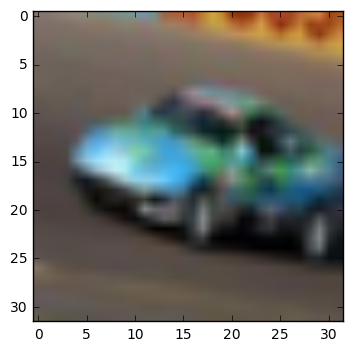

automobile


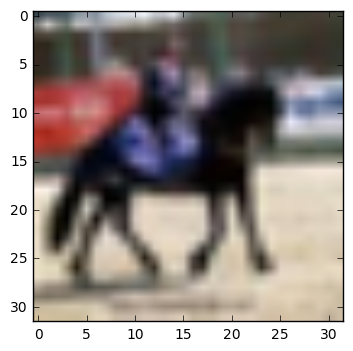

horse


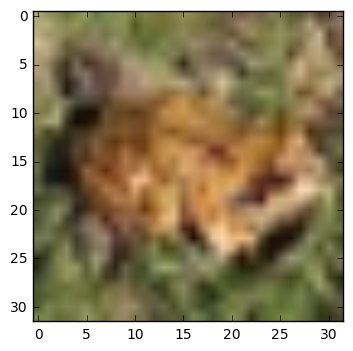

frog


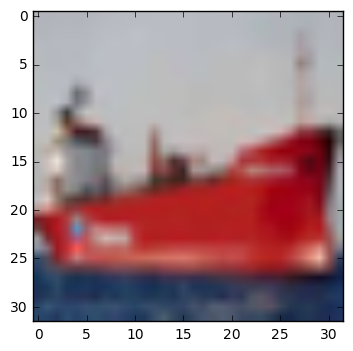

ship


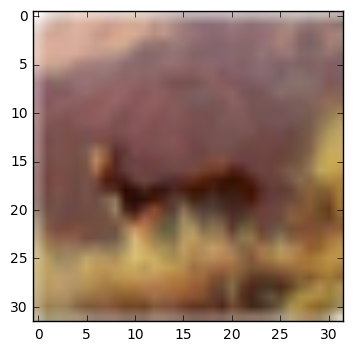

horse


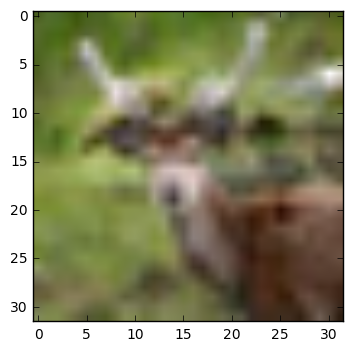

deer


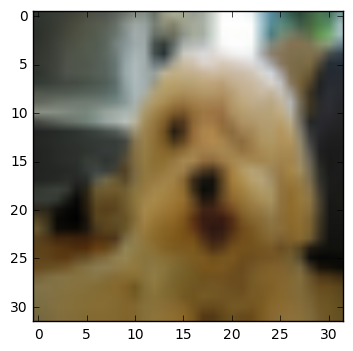

dog


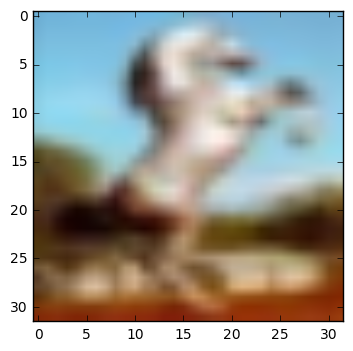

cat


In [22]:
k=4999
n=8
scores = Conv_NN10_1layer1.evaluate(X_test[k:k+n,], y_test[k:k+n,], verbose=0)
s=Conv_NN10_1layer1.predict(X_test[k:k+n,], batch_size=64, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))
for i in range(len(s)):
        for j in range(len(s[i,])):
                if s[i,j]==max(s[i,]):
                    #pyplot.subplot(330 + 1 + i)
                    pyplot.imshow(toimage(X_test[k+i,]))
                    pyplot.show()
                    print(labels[j])

In [27]:
# Create the model
Conv_NN10_multilayer = Sequential()
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), input_shape=(3, 32, 32), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Flatten())
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(1024, activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(512, activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(num_classes, activation='softmax'))
# Compile model
epochs = 30
lrate = 0.008
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
Conv_NN10_multilayer.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
print(Conv_NN10_multilayer.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 64, 32, 32)        1792      
_________________________________________________________________
dropout_15 (Dropout)         (None, 64, 32, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 64, 32, 32)        36928     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 64, 16, 16)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 16, 16)        36928     
_________________________________________________________________
dropout_16 (Dropout)         (None, 64, 16, 16)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 64, 16, 16)        36928     
__________

In [28]:
# Create the model
Conv_NN10_multilayer = Sequential()
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), input_shape=(3, 32, 32), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
Conv_NN10_multilayer.add(MaxPooling2D(pool_size=(2, 2)))
Conv_NN10_multilayer.add(Flatten())
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(1024, activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(512, activation='relu', kernel_constraint=maxnorm(3)))
Conv_NN10_multilayer.add(Dropout(0.2))
Conv_NN10_multilayer.add(Dense(num_classes, activation='softmax'))
# Compile model
epochs = 30
lrate = 0.008
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
Conv_NN10_multilayer.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
print(Conv_NN10_multilayer.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_22 (Conv2D)           (None, 128, 32, 32)       3584      
_________________________________________________________________
dropout_22 (Dropout)         (None, 128, 32, 32)       0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 128, 32, 32)       147584    
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 128, 16, 16)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 128, 16, 16)       147584    
_________________________________________________________________
dropout_23 (Dropout)         (None, 128, 16, 16)       0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 128, 16, 16)       147584    
__________

In [30]:
Conv_NN10_multilayer.fit(X_train, y_train, epochs=5, batch_size=64,validation_split=0.15,callbacks=[early_stopping_monitor])
# Final evaluation of the model
scores = Conv_NN10_multilayer.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 42500 samples, validate on 7500 samples
Epoch 1/5
42500/42500 [==============================] - 3111s - loss: 1.9931 - acc: 0.2640 - val_loss: 1.7507 - val_acc: 0.3740

In [36]:
from keras.models import load_model
Conv_NN10_multilayer.save('Conv_NN10_multilayer.h5')
Conv_NN10_multilayer=load_model('Conv_NN10_multilayer.h5')

In [32]:
Conv_NN10_multilayer.fit(X_train, y_train, epochs=5, batch_size=64,validation_split=0.15,callbacks=[early_stopping_monitor])
# Final evaluation of the model
scores = Conv_NN10_multilayer.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 42500 samples, validate on 7500 samples
Epoch 1/5
42500/42500 [==============================] - 4336s - loss: 1.0822 - acc: 0.6135 - val_loss: 0.9930 - val_acc: 0.6511

In [35]:
Conv_NN10_multilayer.fit(X_train, y_train, epochs=15, batch_size=64,validation_split=0.15,callbacks=[early_stopping_monitor])
# Final evaluation of the model
scores = Conv_NN10_multilayer.evaluate(X_test, y_tes at, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 42500 samples, validate on 7500 samples
Epoch 1/15
42500/42500 [==============================] - 3213s - loss: 0.7433 - acc: 0.7365 - val_loss: 0.7733 - val_acc: 0.7289

In [42]:
Conv_NN10_multilayer.fit(X_train, y_train, epochs=15, batch_size=64,validation_split=0.05,callbacks=[early_stopping_monitor])
# Final evaluation of the model
scores = Conv_NN10_multilayer.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 47500 samples, validate on 2500 samples
Epoch 1/15
47500/47500 [==============================] - 3202s - loss: 0.4014 - acc: 0.8601 - val_loss: 0.5667 - val_acc: 0.8132

In [45]:
scores = Conv_NN10_multilayer.evaluate(X_train, y_train, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Accuracy: 96.29%


In [46]:
from keras.models import load_model
Conv_NN10_multilayer.save('Conv_NN10_multilayer.h5')
Conv_NN10_multilayer=load_model('Conv_NN10_multilayer.h5')

Accuracy: 84.00%


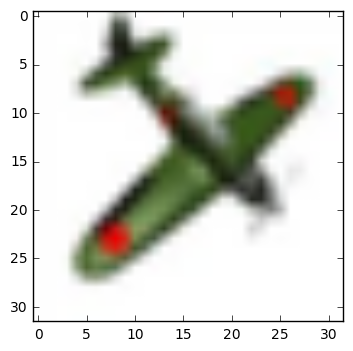

airplane


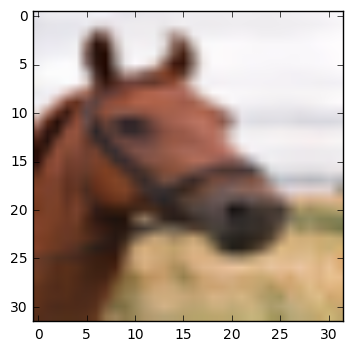

horse


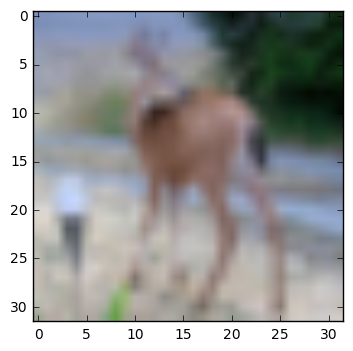

deer


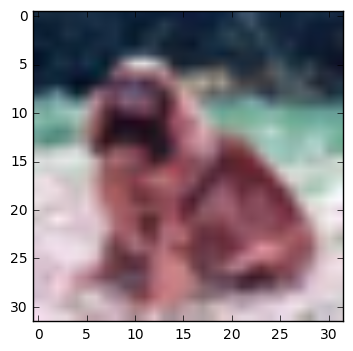

dog


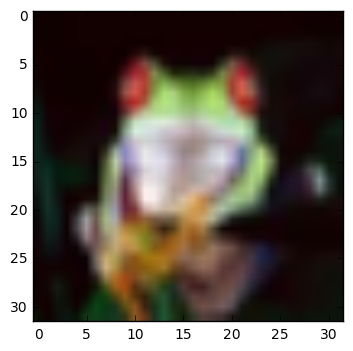

frog


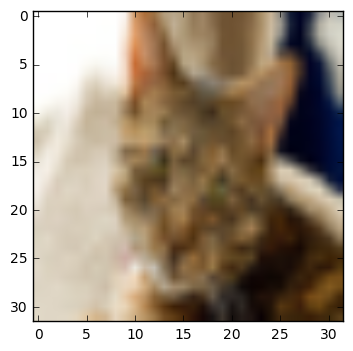

cat


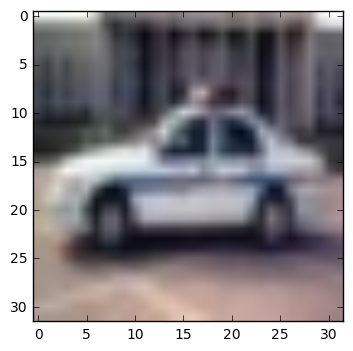

automobile


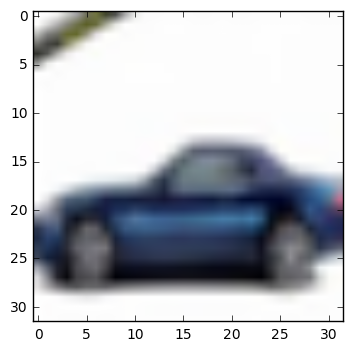

automobile


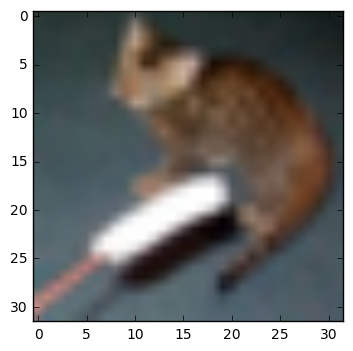

cat


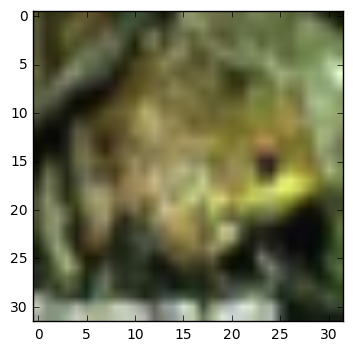

frog


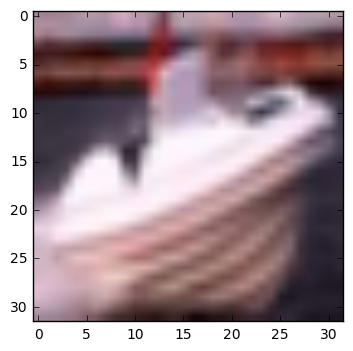

ship


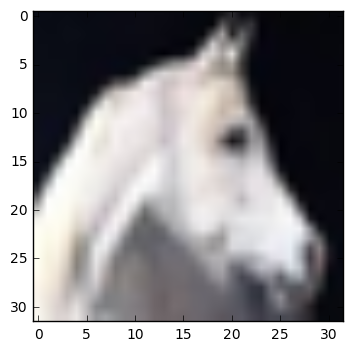

horse


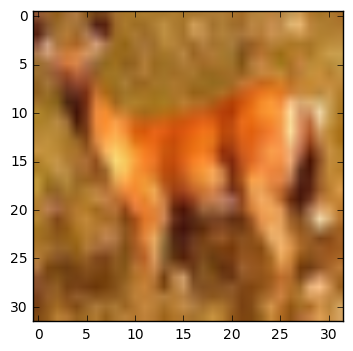

deer


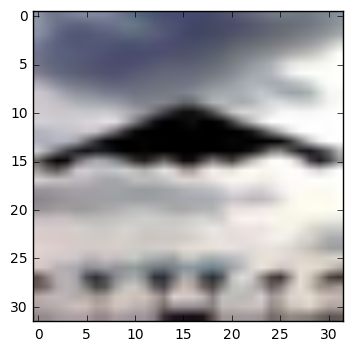

airplane


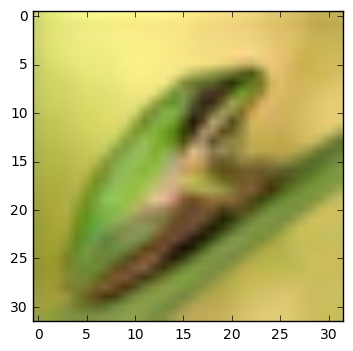

bird


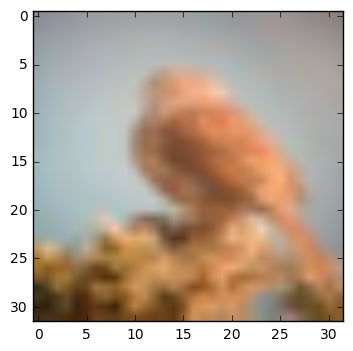

bird


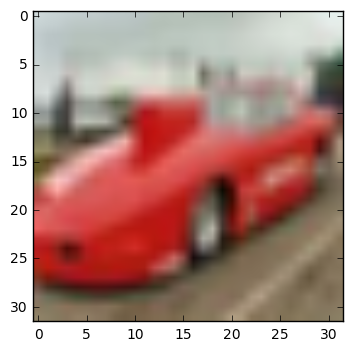

automobile


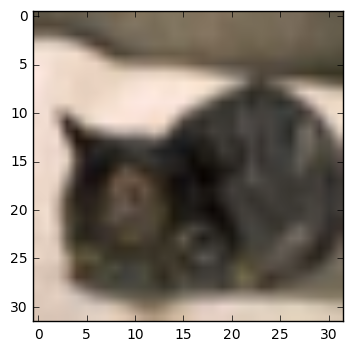

cat


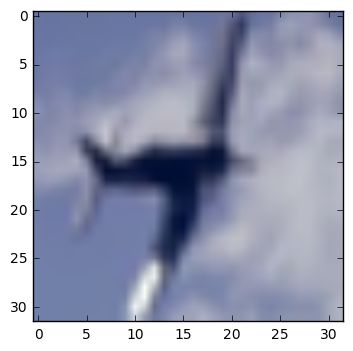

airplane


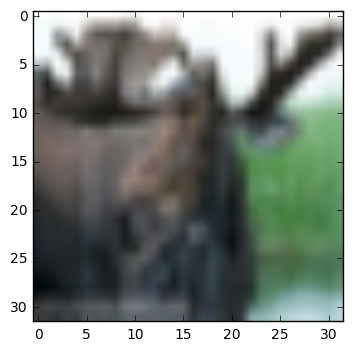

deer


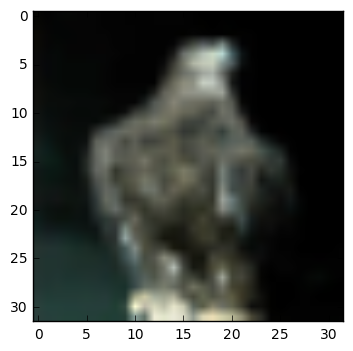

frog


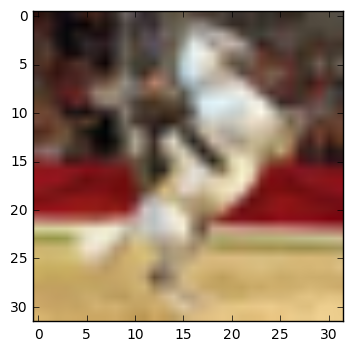

horse


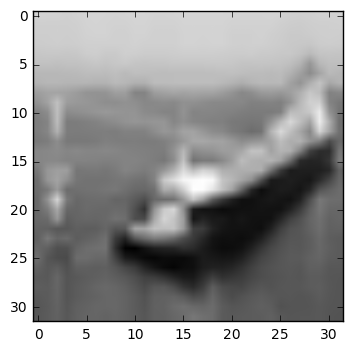

ship


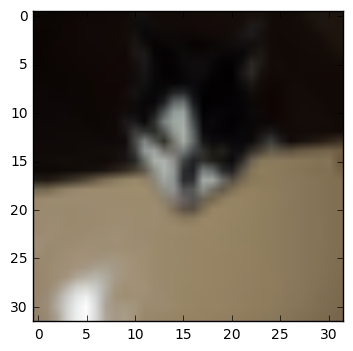

cat


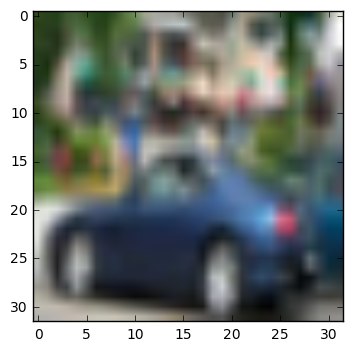

automobile


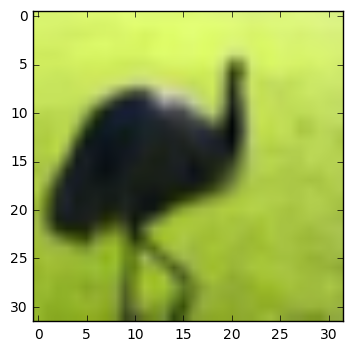

bird


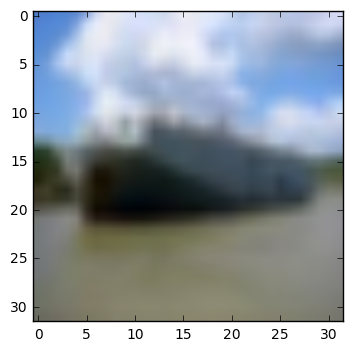

ship


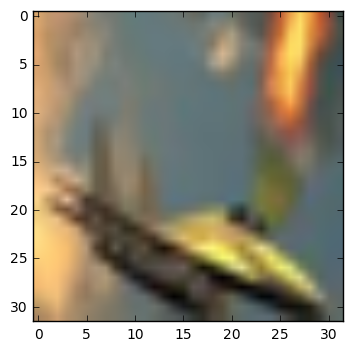

airplane


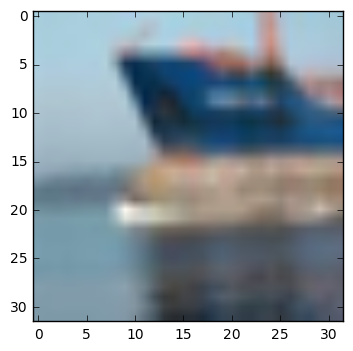

ship


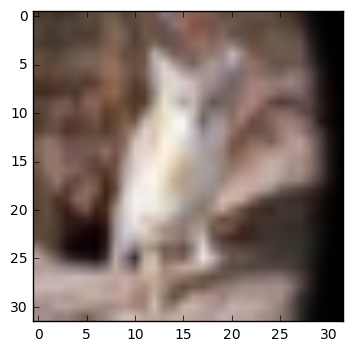

cat


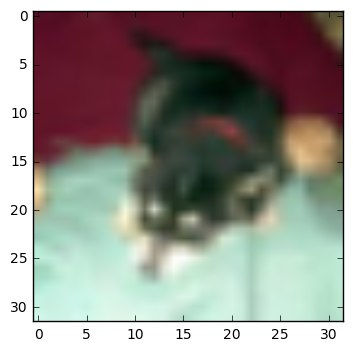

dog


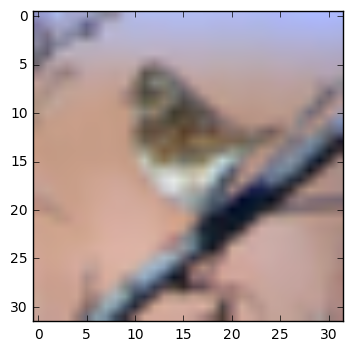

bird


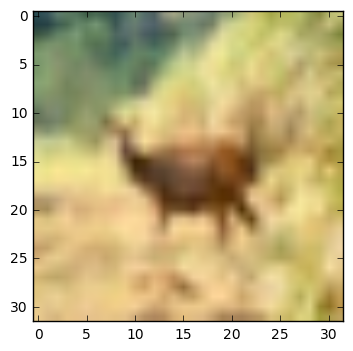

deer


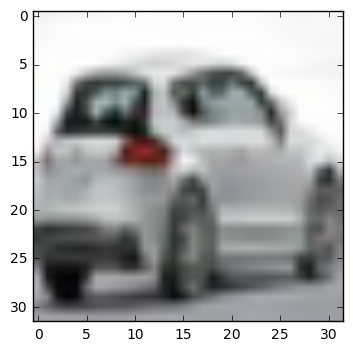

automobile


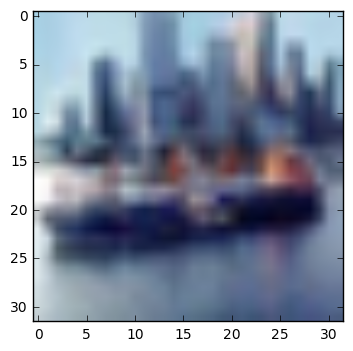

ship


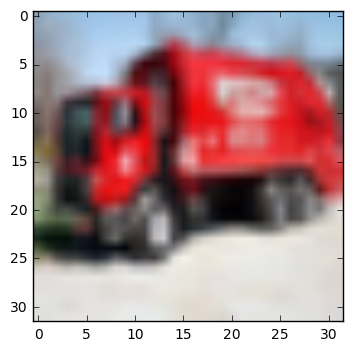

truck


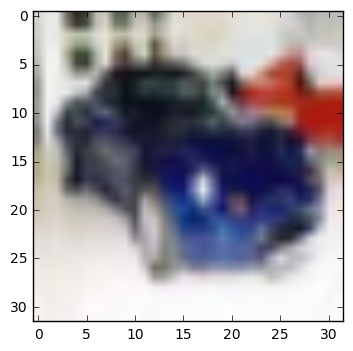

automobile


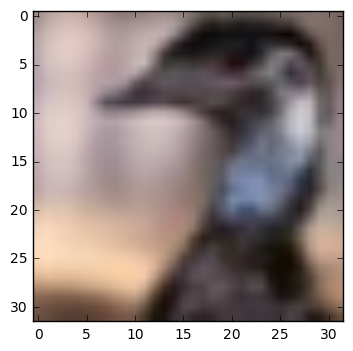

bird


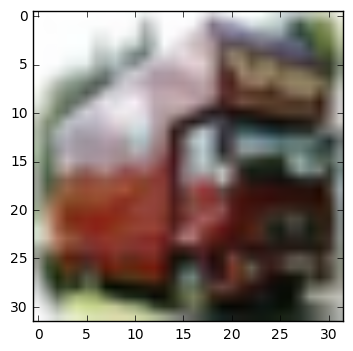

truck


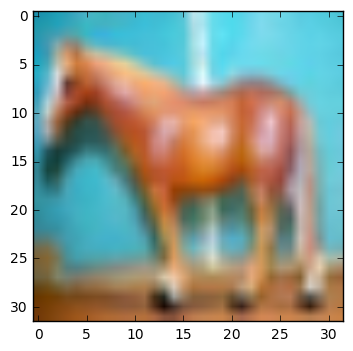

horse


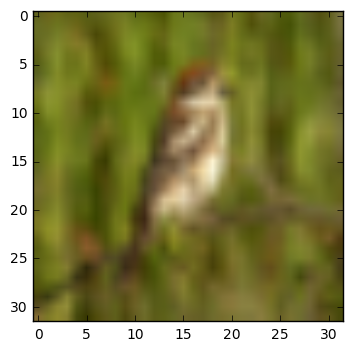

bird


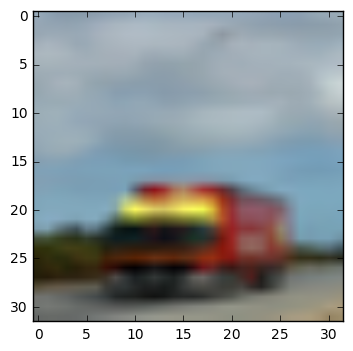

ship


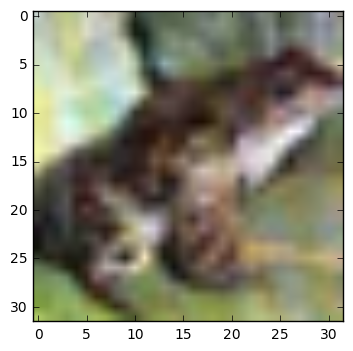

frog


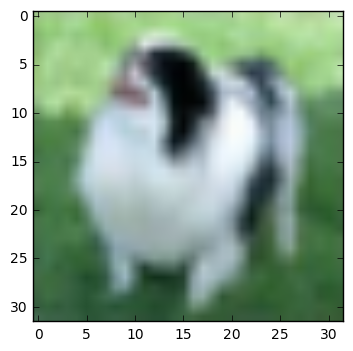

dog


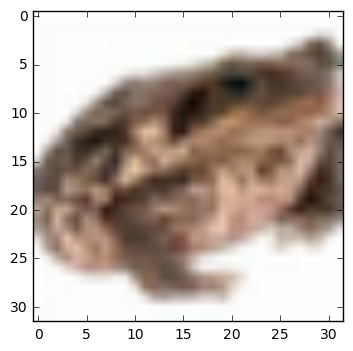

frog


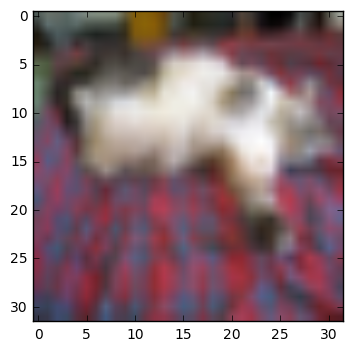

dog


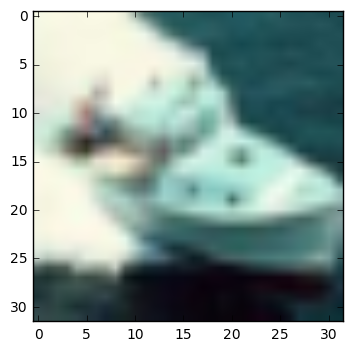

ship


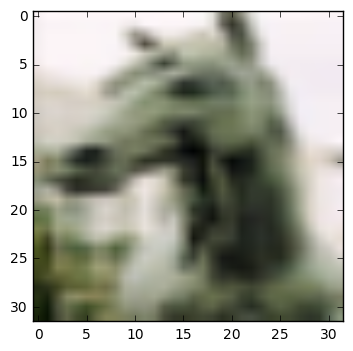

horse


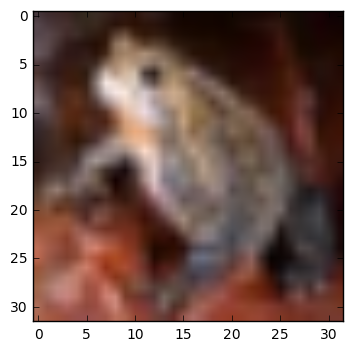

frog


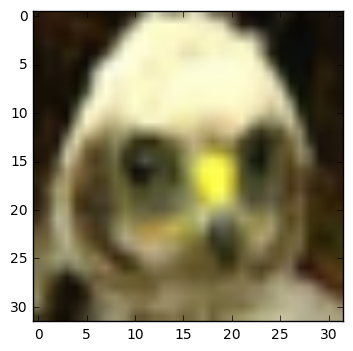

dog


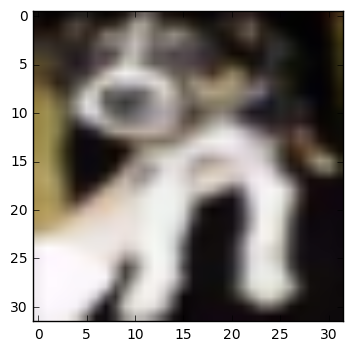

dog


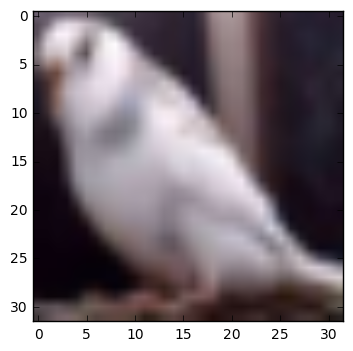

bird


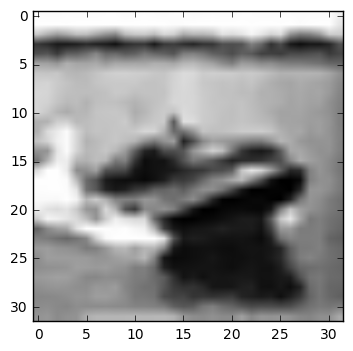

ship


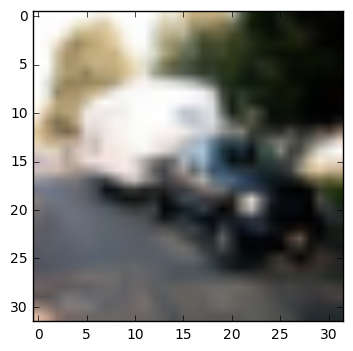

truck


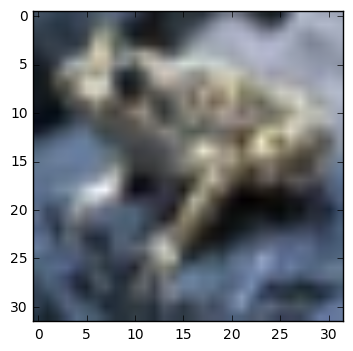

frog


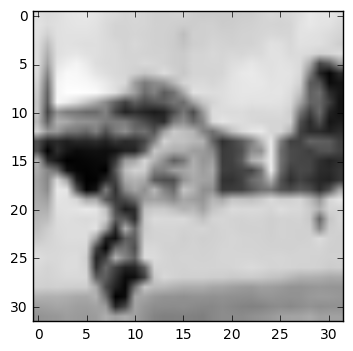

airplane


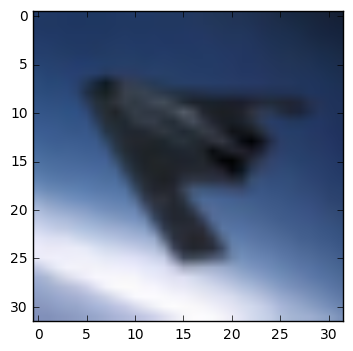

airplane


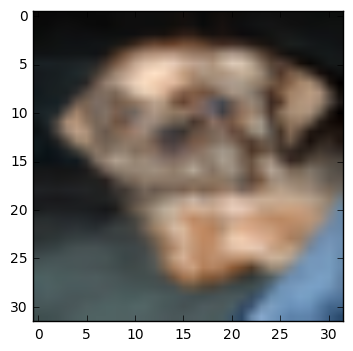

dog


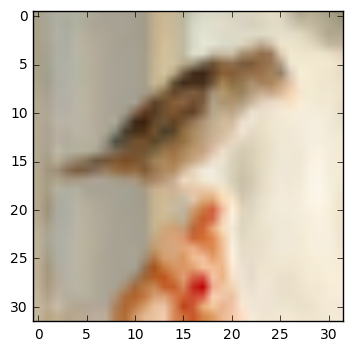

bird


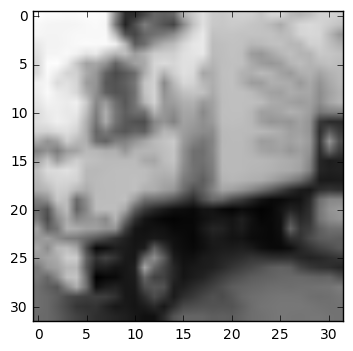

truck


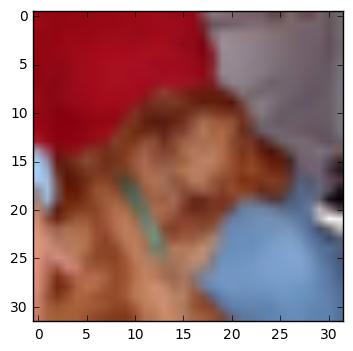

dog


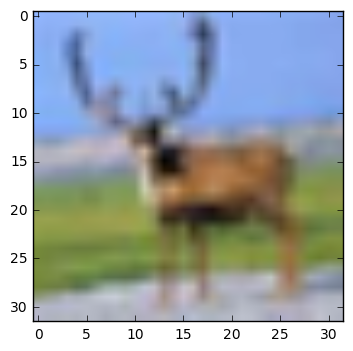

deer


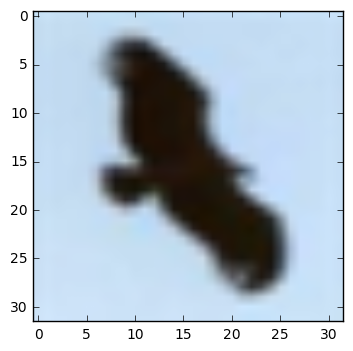

bird


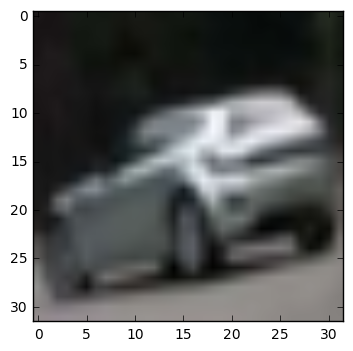

automobile


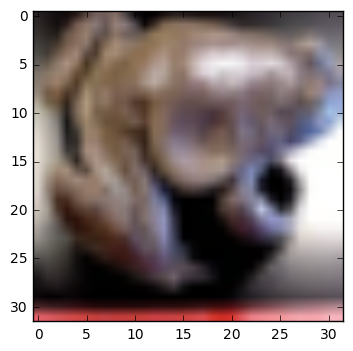

cat


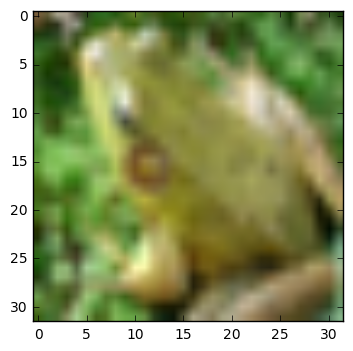

frog


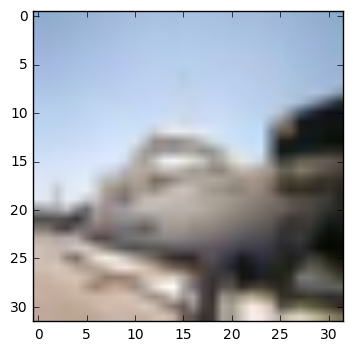

airplane


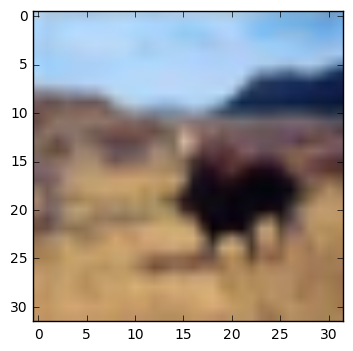

horse


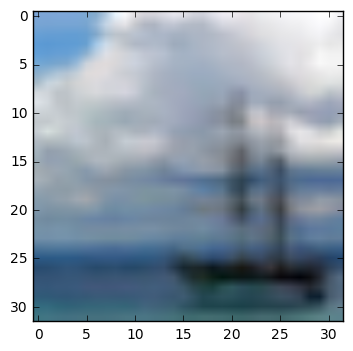

ship


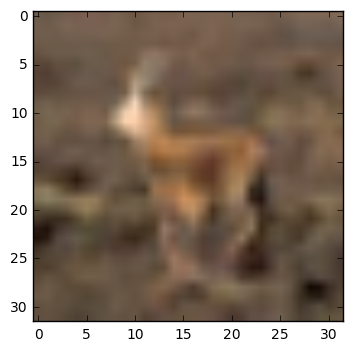

deer


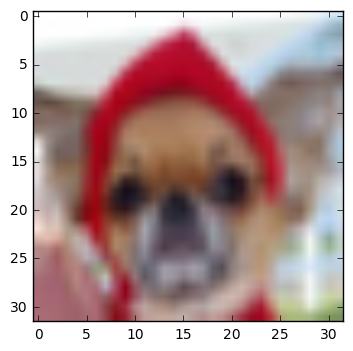

dog


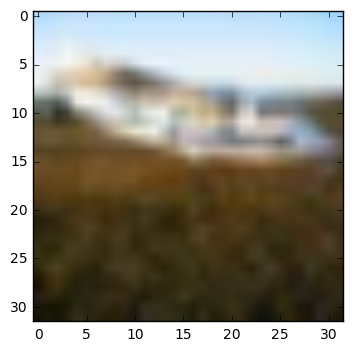

airplane


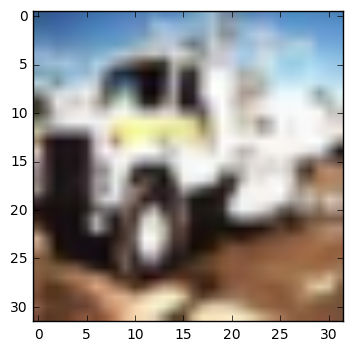

truck


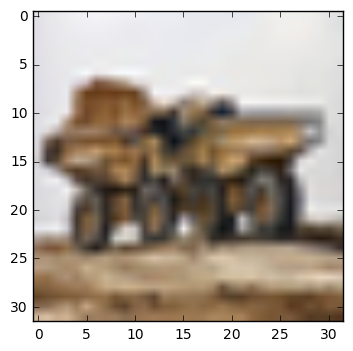

airplane


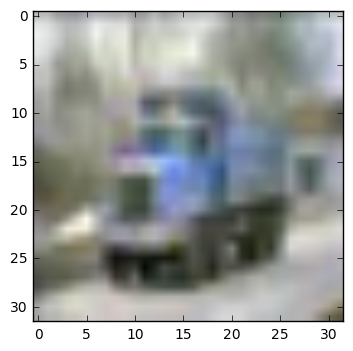

truck


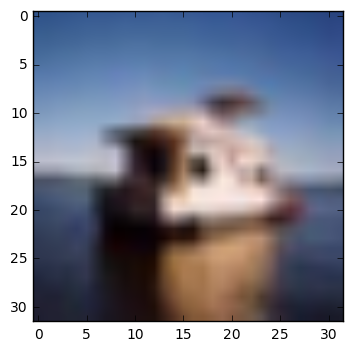

ship


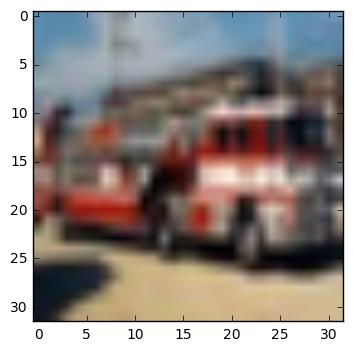

truck


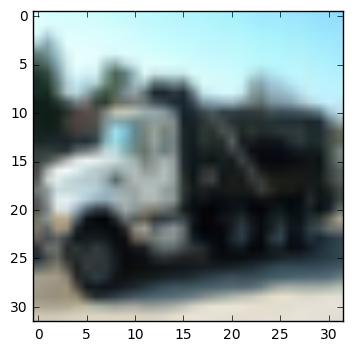

truck


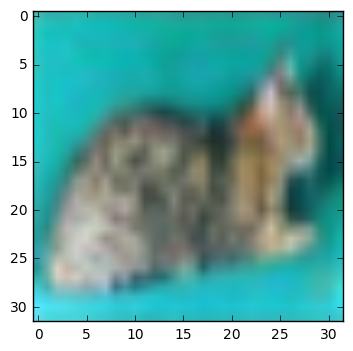

cat


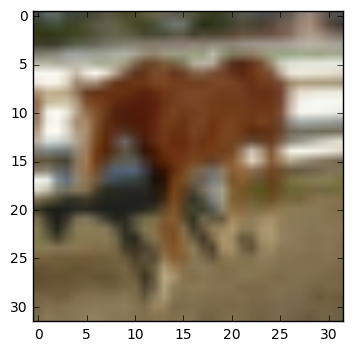

horse


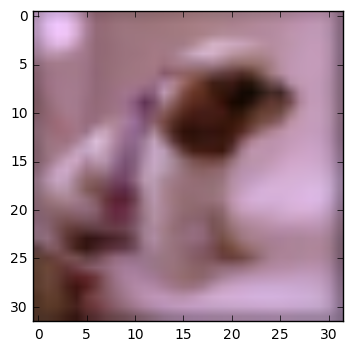

cat


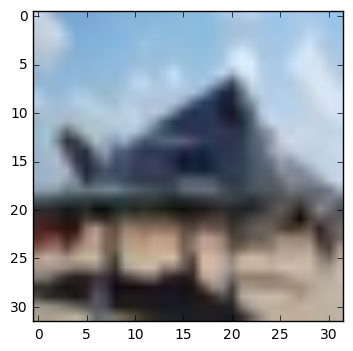

airplane


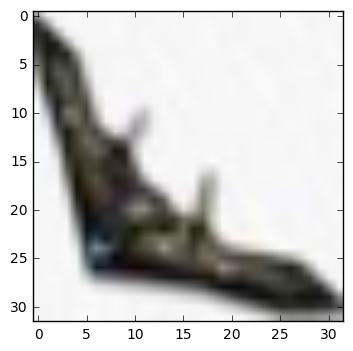

airplane


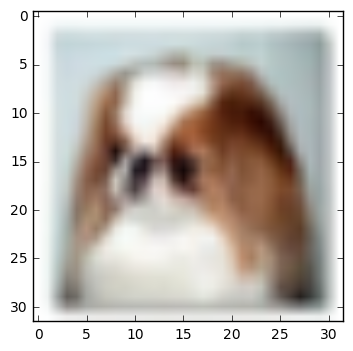

dog


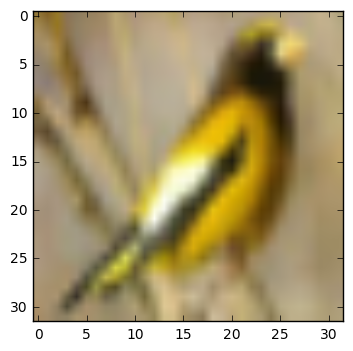

bird


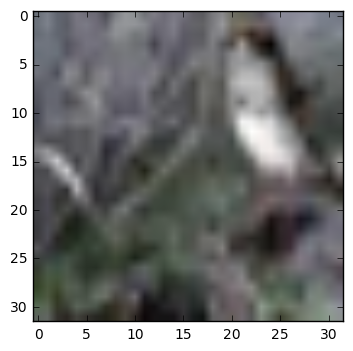

frog


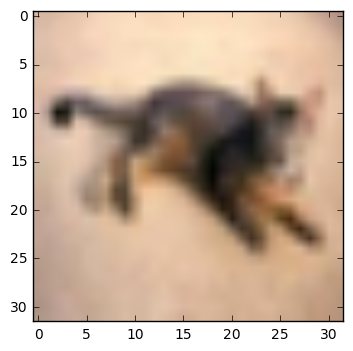

airplane


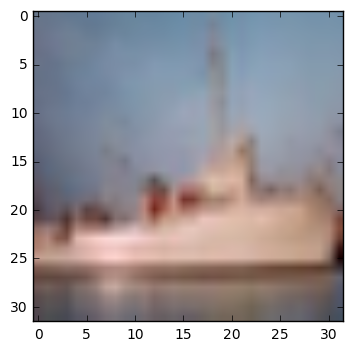

ship


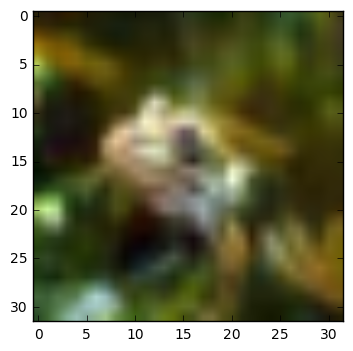

frog


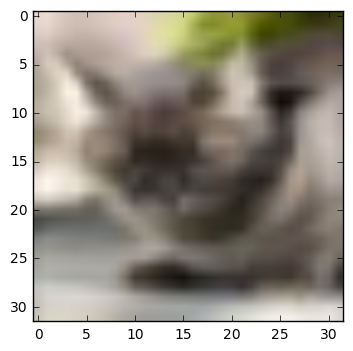

cat


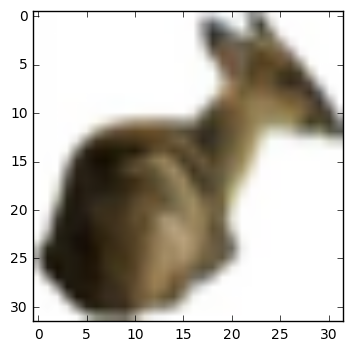

frog


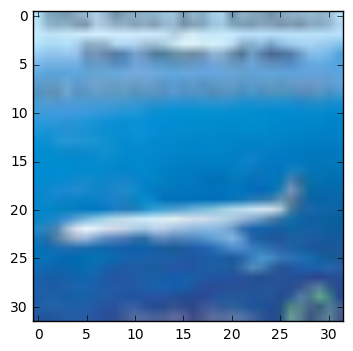

ship


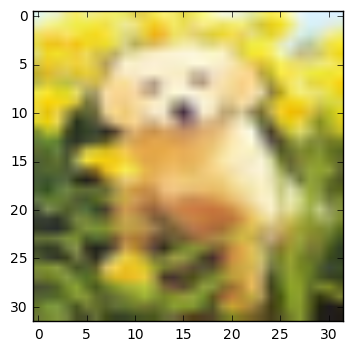

dog


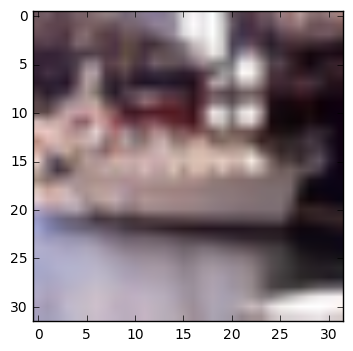

ship


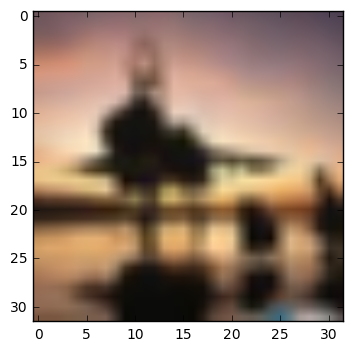

horse


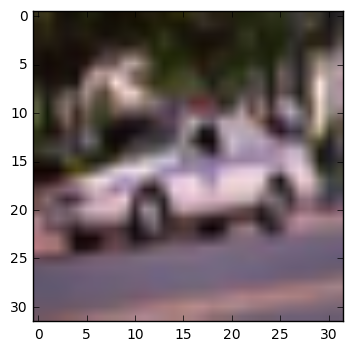

automobile


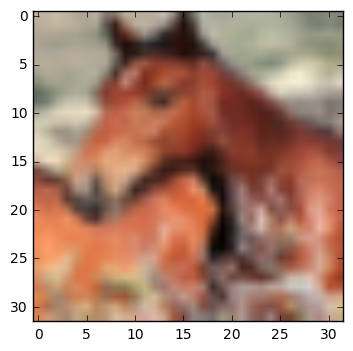

horse


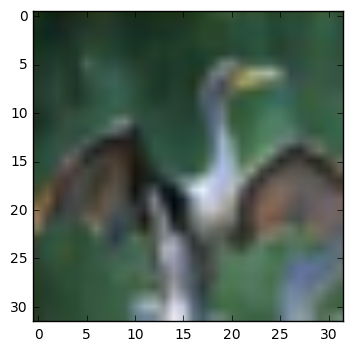

cat


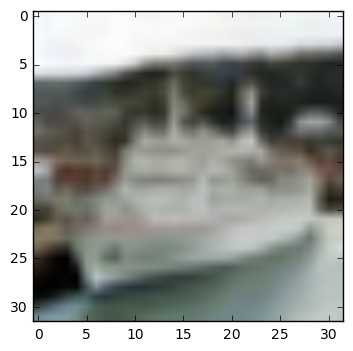

ship


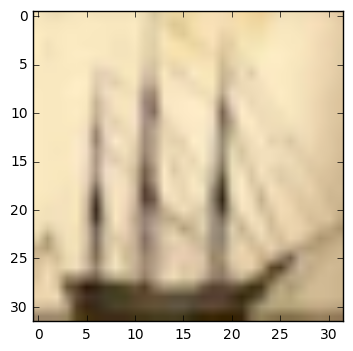

ship


In [44]:
k=98
n=100
scores = Conv_NN10_multilayer.evaluate(X_test[k:k+n,], y_test[k:k+n,], verbose=0)
s=Conv_NN10_multilayer.predict(X_test[k:k+n,], batch_size=64, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))
for i in range(len(s)):
        for j in range(len(s[i,])):
                if s[i,j]==max(s[i,]):
                    #pyplot.subplot(330 + 1 + i)
                    pyplot.imshow(toimage(X_test[k+i,]))
                    pyplot.show()
                    print(labels[j])